<a href="https://colab.research.google.com/github/GSMalavika/Tire-Texture-Classifictaion/blob/main/TireTexture.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

# importing modules for CNN
from keras.models import Sequential
from keras.layers import Dense,Conv2D,MaxPooling2D,Flatten,Dropout
from keras.preprocessing.image import ImageDataGenerator
from keras.optimizers import SGD
import keras

# for image accesing and processing
from matplotlib.image import imread
import os
import cv2
from PIL import Image,ImageEnhance


Accessing the data

In [ ]:
train_dir='/content/drive/MyDrive/Tire Textures/training_data'
test_dir='/content/drive/MyDrive/Tire Textures/testing_data'

train_folders=os.listdir(train_dir)
test_folders=os.listdir(test_dir)
print(train_folders)
print(test_folders)

['normal', 'cracked']
['cracked', 'normal']


Number of images in both training data folders and testing folders

In [ ]:

def count_images(data_folder):
  for folder in train_folders:
    print(folder,len(os.listdir(os.path.join(train_dir,folder))))

print("Number of images in testing data")
count_images(train_folders)
print("Number of images in testing data")
count_images(test_folders)



Number of images in testing data
normal 376
cracked 327
Number of images in testing data
normal 376
cracked 327


Look into the data

Number of samples in normal class is 376



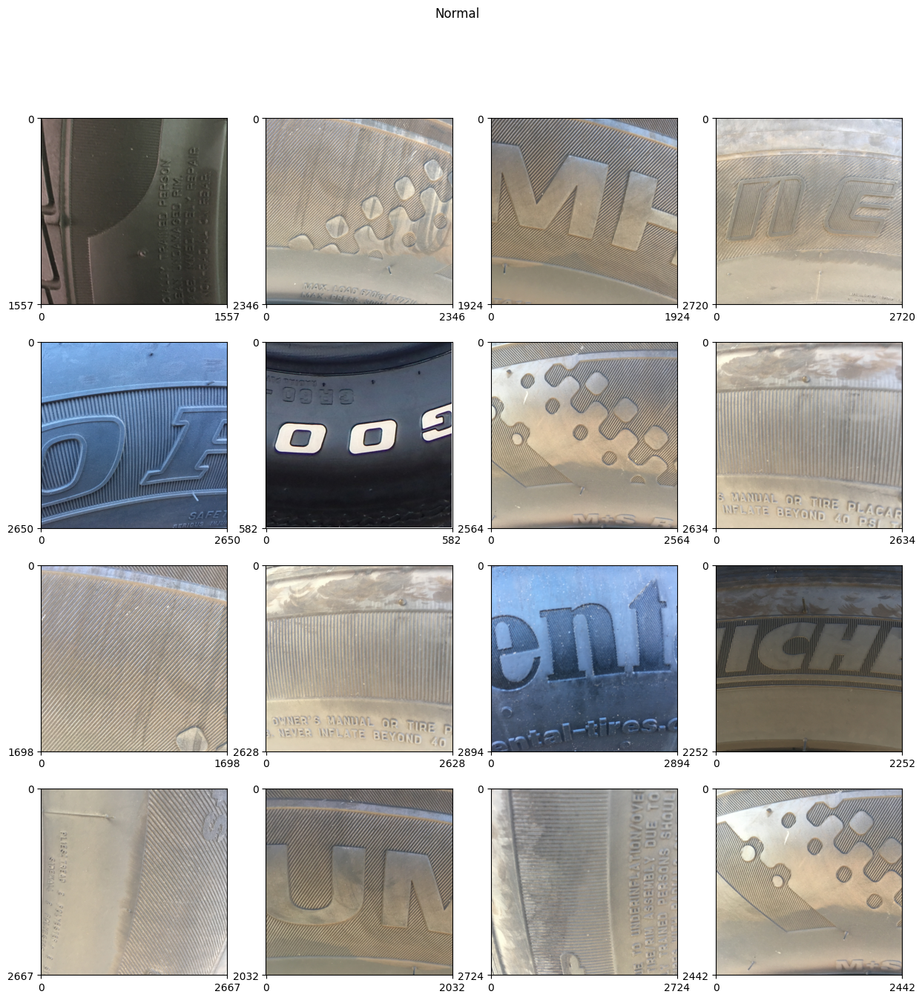



Number of samples in cracked class is 327



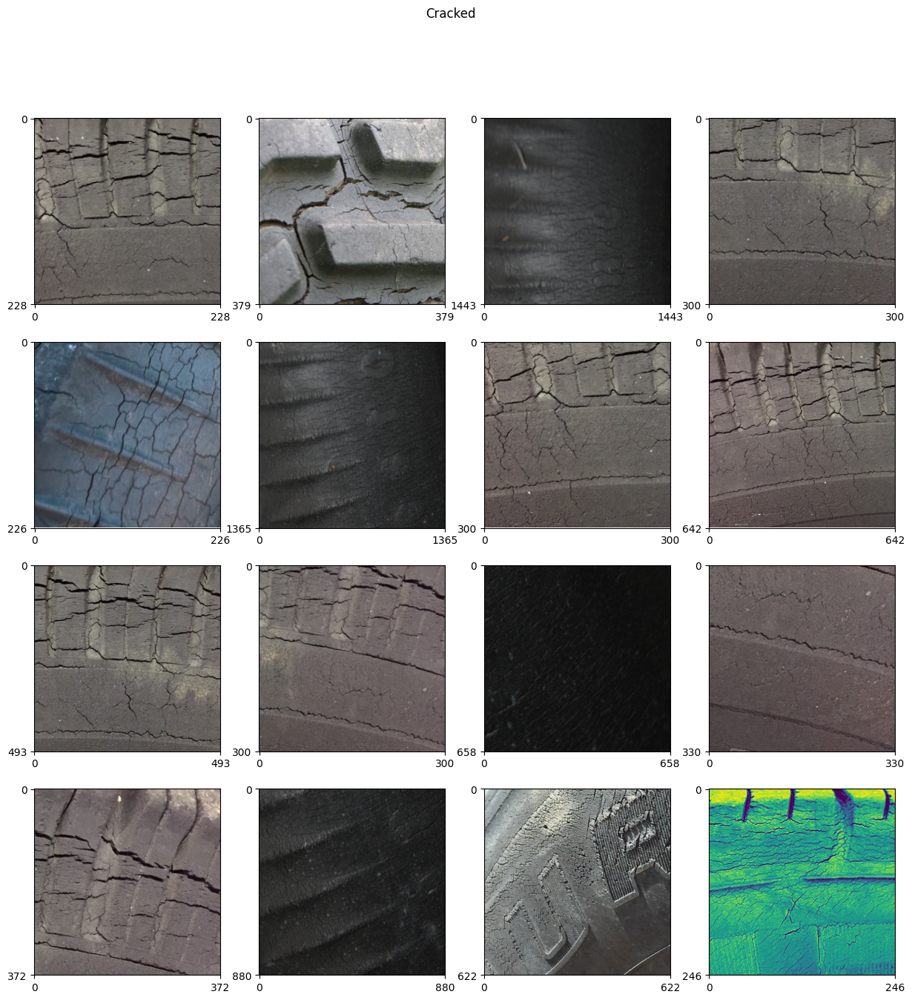

In [ ]:
for folder in train_folders:
    filenames=os.listdir(os.path.join(train_dir,folder))
    print('Number of samples in {} class is {}\n'.format(folder, len(filenames)))
    fig, ax = plt.subplots(nrows=4, ncols=4, figsize=(15, 15))
    for i in range(16):
        plt.subplot(4, 4, i+1)
        filepath = os.path.join(train_dir, folder, filenames[i])
        image = imread(filepath)
        plt.imshow(image)
        plt.xticks([0, image.shape[0]])
        plt.yticks([0, image.shape[1]])
    plt.suptitle(folder.capitalize())
    plt.show()
    print('\n')

Get variations in size

In [ ]:
def img_files(get_path):
  img=[]
  label=[]
  for folder in os.listdir(get_path):
    for file in os.listdir(os.path.join(get_path,folder)):
      img.append(os.path.join(get_path,folder,file))
      label.append(folder)
  return img,label

train_files,train_labels=img_files(train_dir)
test_files,test_labels=img_files(test_dir)
sizes=[]
labels=[]
for folder in os.listdir(train_dir):
  for file in os.listdir(os.path.join(train_dir,folder)):
    img=Image.open(os.path.join(train_dir,folder,file))
    sizes.append(img.size)
    labels.append(folder)
sizes_df=pd.DataFrame(sizes,columns=['width','height'])
sizes_df['label']=labels
print(sizes_df.head())
print(sizes_df.tail())
print(sizes_df.min())
print(sizes_df.max())

   width  height   label
0   1557    1557  normal
1   2346    2346  normal
2   1924    1924  normal
3   2720    2720  normal
4   2650    2650  normal
     width  height    label
698    524     524  cracked
699    344     344  cracked
700    567     567  cracked
701    544     544  cracked
702    393     393  cracked
width         224
height        224
label     cracked
dtype: object
width       3024
height      3024
label     normal
dtype: object


Plotting the distribution of sizes

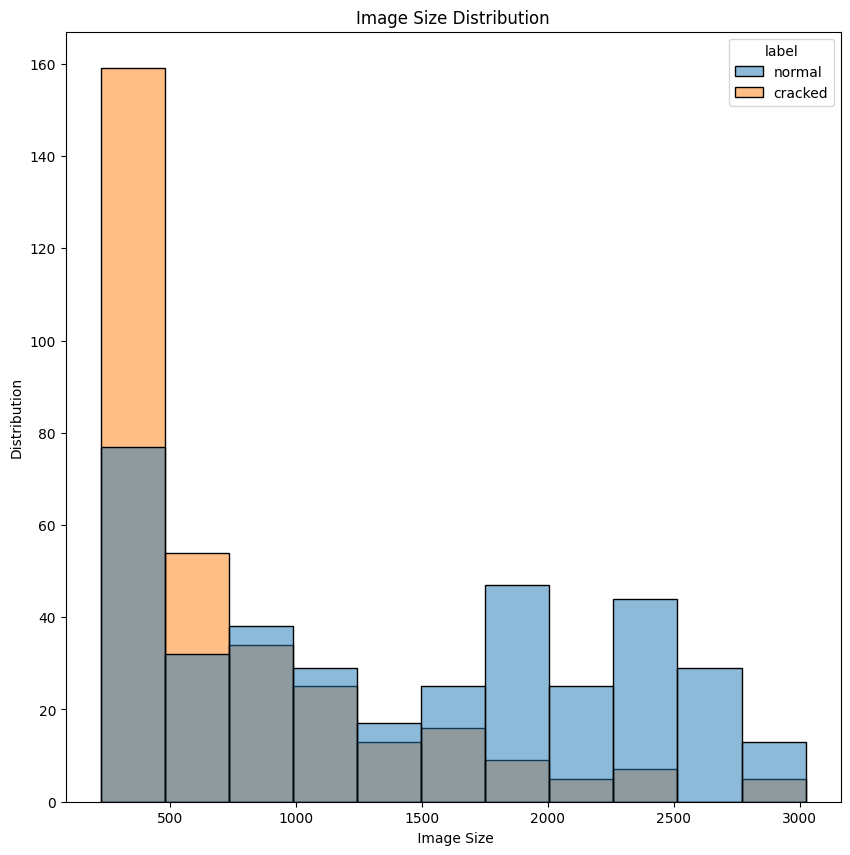

In [ ]:
plt.figure(figsize=(10,10))
sns.histplot(data=sizes_df,x=sizes_df['width'],hue=sizes_df['label'])
plt.xlabel(' Image Size')
plt.ylabel('Distribution')
plt.title('Image Size Distribution')
plt.show()



Text(0.5, 1.0, 'Distribution of images based on classes')

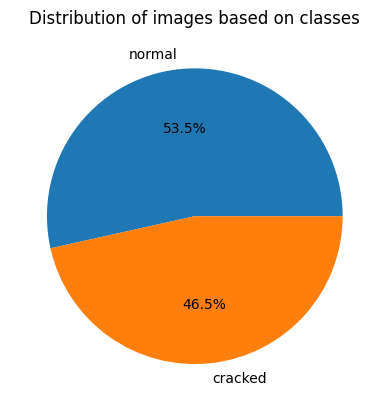

In [ ]:

plt.pie(sizes_df['label'].value_counts(),autopct='%1.1f%%',labels=sizes_df['label'].value_counts().index)
plt.title('Distribution of images based on classes')


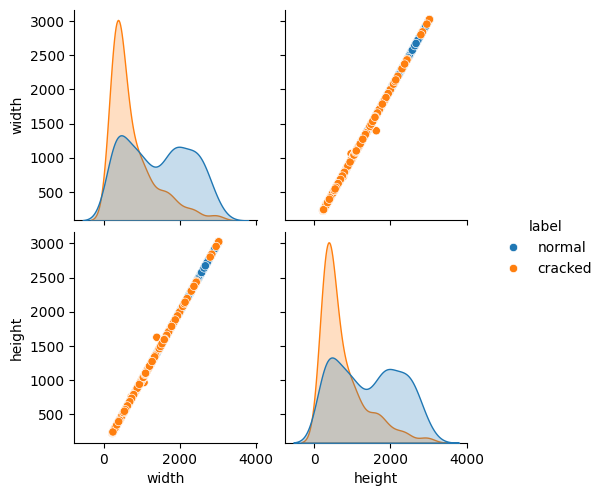

In [ ]:
sns.pairplot(sizes_df,hue='label')

Text(0.5, 1.0, 'Image Size Distribution')

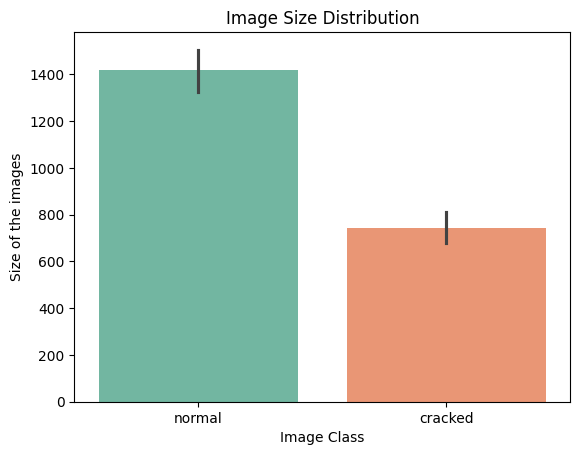

In [ ]:
sns.barplot(x=sizes_df['label'],y=sizes_df['width'],hue=sizes_df['label'],color=sns.color_palette()[0],palette='Set2')
plt.xlabel('Image Class')
plt.ylabel('Size of the images')
plt.title('Image Size Distribution')

to understand small image size and large image sizes

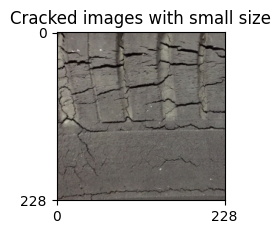

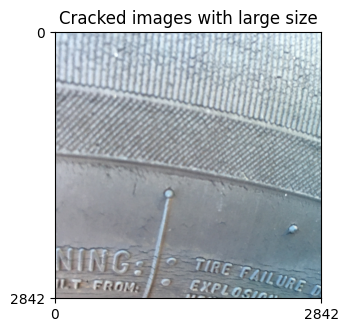

In [ ]:
# plotting an image with size< 300
for folder in os.listdir(train_dir):
    if folder=="cracked":
      cracked_small_300=np.where((sizes_df['width']<300) & (sizes_df['label']==folder))
      cracked_large_2500=np.where((sizes_df['width']>2500) & (sizes_df['label']==folder))
      img_small=Image.open(train_files[cracked_small_300[0][0]])
      img_large=Image.open(train_files[cracked_large_2500[0][0]])
      plt.subplot(2,1,1)
      plt.imshow(img_small)
      plt.xticks([0,img_small.size[0]])
      plt.yticks([0,img_small.size[1]])
      plt.title("Cracked images with small size")
      plt.show()
      plt.subplot(1,2,2)
      plt.imshow(img_large)
      plt.xticks([0,img_large.size[0]])
      plt.yticks([0,img_large.size[1]])
      plt.title("Cracked images with large size")
      plt.tight_layout()
      plt.show()


Check quality of issues in the training data

In [ ]:
!pip install cleanvision

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.9/55.9 kB 2.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 11.2 MB/s eta 0:00:00


Reading images from /content/drive/MyDrive/Tire Textures/training_data/normal
Checking for dark, light, odd_aspect_ratio, low_information, exact_duplicates, near_duplicates, blurry, grayscale, odd_size images ...


  0%|          | 0/376 [00:00<?, ?it/s]

  0%|          | 0/376 [00:00<?, ?it/s]

Issue checks completed. 21 issues found in the dataset. To see a detailed report of issues found, use imagelab.report().
Issues found in images in order of severity in the dataset

|    | issue_type       |   num_images |
|---:|:-----------------|-------------:|
|  0 | dark             |           15 |
|  1 | exact_duplicates |            6 |
|  2 | blurry           |            0 |
|  3 | grayscale        |            0 |
|  4 | light            |            0 |
|  5 | low_information  |            0 |
|  6 | odd_aspect_ratio |            0 |
|  7 | odd_size         |            0 |
|  8 | near_duplicates  |            0 | 

----------------------- dark images ------------------------

Number of examples with this issue: 15
Examples representing most severe instances of this issue:



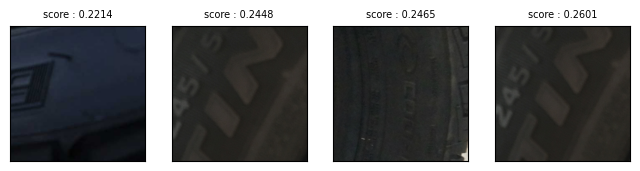

----------------- exact_duplicates images ------------------

Number of examples with this issue: 6
Examples representing most severe instances of this issue:

Set: 0


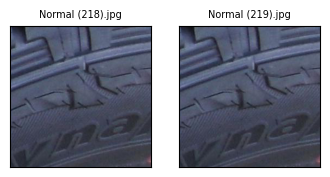

Set: 1


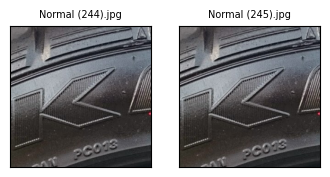

Set: 2


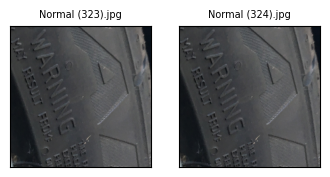

Reading images from /content/drive/MyDrive/Tire Textures/training_data/cracked
Checking for dark, light, odd_aspect_ratio, low_information, exact_duplicates, near_duplicates, blurry, grayscale, odd_size images ...


  0%|          | 0/327 [00:00<?, ?it/s]

  0%|          | 0/327 [00:00<?, ?it/s]

Issue checks completed. 23 issues found in the dataset. To see a detailed report of issues found, use imagelab.report().
Issues found in images in order of severity in the dataset

|    | issue_type       |   num_images |
|---:|:-----------------|-------------:|
|  0 | dark             |           15 |
|  1 | near_duplicates  |            4 |
|  2 | odd_size         |            3 |
|  3 | grayscale        |            1 |
|  4 | blurry           |            0 |
|  5 | light            |            0 |
|  6 | low_information  |            0 |
|  7 | odd_aspect_ratio |            0 |
|  8 | exact_duplicates |            0 | 

----------------------- dark images ------------------------

Number of examples with this issue: 15
Examples representing most severe instances of this issue:



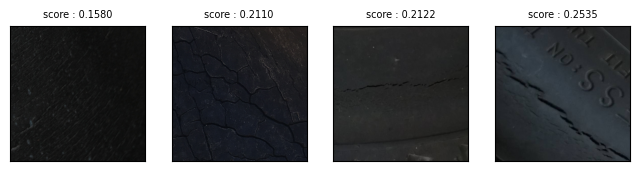

------------------ near_duplicates images ------------------

Number of examples with this issue: 4
Examples representing most severe instances of this issue:

Set: 0


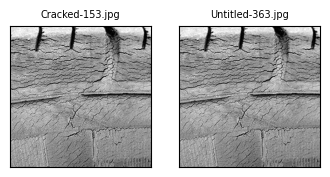

Set: 1


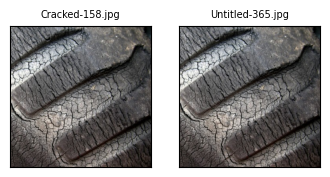

--------------------- odd_size images ----------------------

Number of examples with this issue: 3
Examples representing most severe instances of this issue:



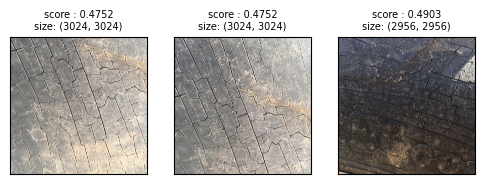

--------------------- grayscale images ---------------------

Number of examples with this issue: 1
Examples representing most severe instances of this issue:



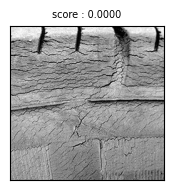

In [ ]:
from cleanvision.imagelab import Imagelab
for folder in train_folders:
  image_lab=Imagelab(os.path.join(train_dir,folder))
  image_lab.find_issues()
  image_lab.report()
  # image_lab.quality_check()
  # image_lab.quality_check_summary()
  # image_lab.quality_check_summary_plot()



Data Augmentation

In [ ]:
train_data_gen=datagen.flow_from_directory(
    train_dir,
    target_size=(842,842),
    color_mode='grayscale',
    classes = {"normal": 0, "cracked": 1},
    batch_size=32,
    class_mode='binary',
    subset='training'
)
val_data_gen=datagen.flow_from_directory(
    train_dir,
    target_size=(842,842),
    color_mode='grayscale',
    classes = {"normal": 0, "cracked": 1},
    batch_size=32,
    class_mode='binary',
    subset='validation')

test_data_gen=datagen.flow_from_directory(
    test_dir,
    color_mode='grayscale',
    classes = {"normal": 0, "cracked": 1},
    target_size=(842,842),
    batch_size=32,
    class_mode='binary'
)

Found 563 images belonging to 2 classes.
Found 140 images belonging to 2 classes.
Found 325 images belonging to 2 classes.


In [ ]:
class_dict=train_data_gen.class_indices
mapping_class={v:k for k,v in class_dict.items()}
mapping_class
def visualizeImageBatch(dataset, title):
    images, labels = next(iter(dataset))
    images = images.reshape(32, *(842,842))
    fig, axes = plt.subplots(8, 8, figsize=(16,16))

    for ax, img, label in zip(axes.flat, images, labels):
        ax.imshow(img, cmap = "gray")
        ax.axis("off")
        ax.set_title(mapping_class[label], size = 20)

    plt.tight_layout()
    fig.suptitle(title, size = 30, y = 1.05, fontweight = "bold")
    plt.show()

    return images

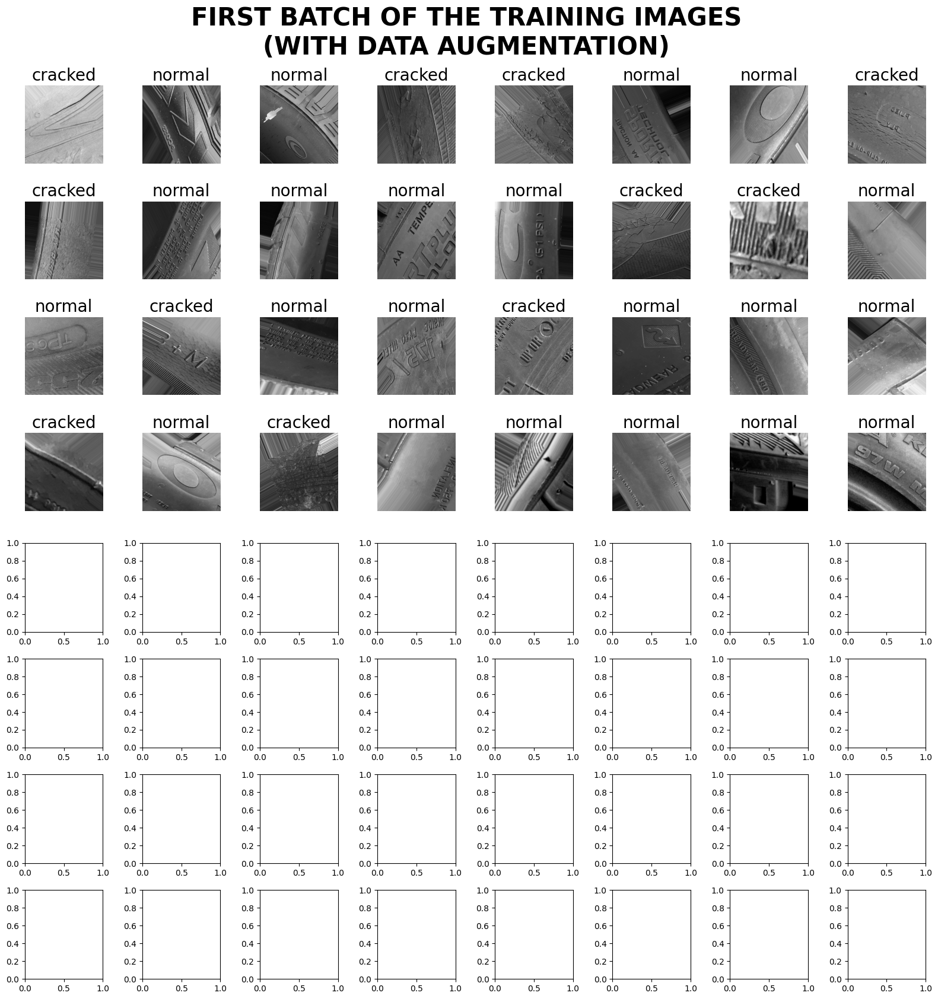

In [ ]:
train_images = visualizeImageBatch(train_data_gen,
                                   "FIRST BATCH OF THE TRAINING IMAGES\n(WITH DATA AUGMENTATION)")

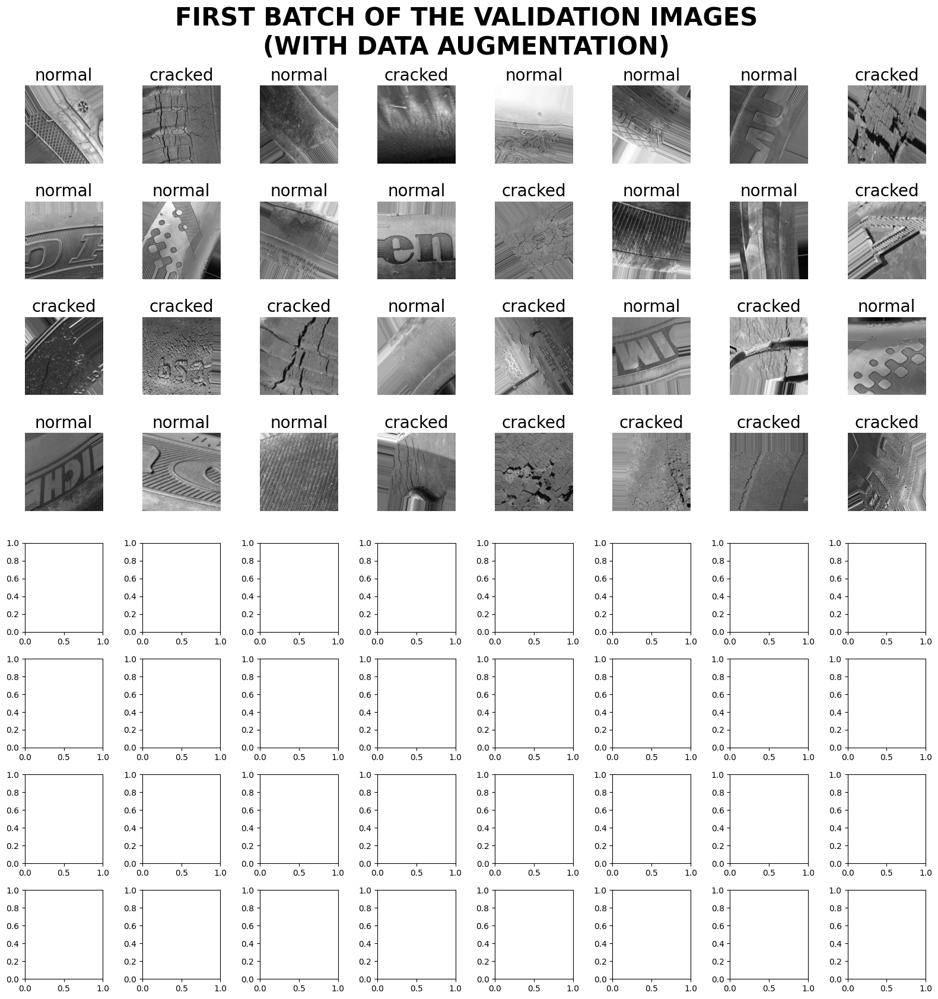

In [ ]:
val_images = visualizeImageBatch(val_data_gen,
                                   "FIRST BATCH OF THE VALIDATION IMAGES\n(WITH DATA AUGMENTATION)")

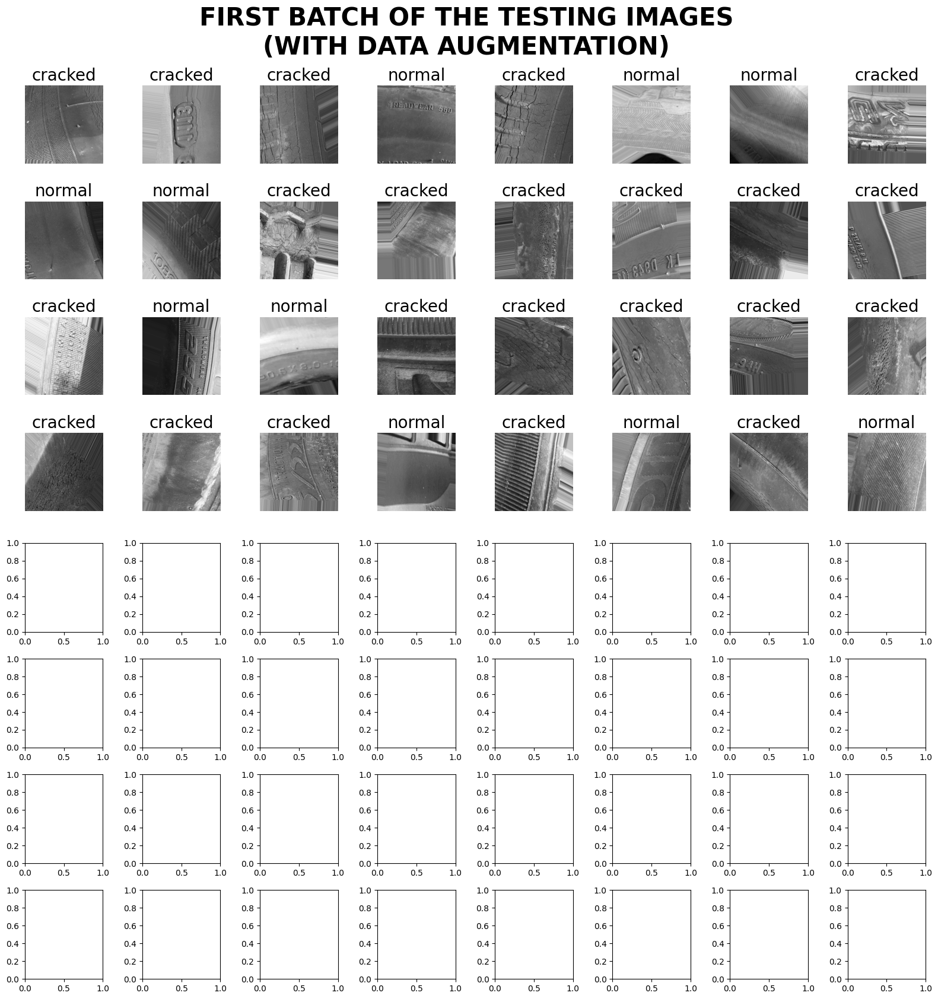

In [ ]:
test_images = visualizeImageBatch(test_data_gen,
                                   "FIRST BATCH OF THE TESTING IMAGES\n(WITH DATA AUGMENTATION)")

In [ ]:
from fastcore.all import *
from fastai.vision.all import *

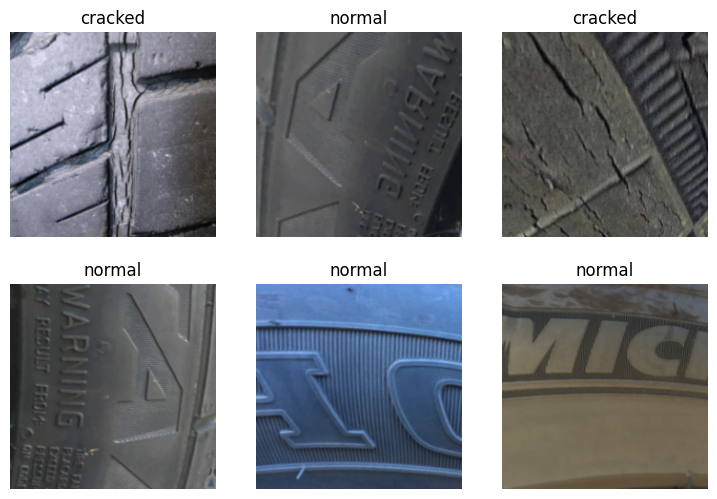

In [ ]:
def sharpness(item,value):
    if(isinstance(item, PILImage)):
        tmpEnhancer = ImageEnhance.Sharpness(item)
        return tmpEnhancer.enhance(value)
    return item

def sharpnessL(value):
    return lambda x : sharpness(x,value)

train_val_data = ImageDataLoaders.from_folder(train_dir,valid_pct=0.2, seed=42,
    item_tfms=[Resize(224, method='squish'),sharpnessL(4)],
    batch_tfms=aug_transforms(size=224, min_scale=0.90),
    bs=32)

train_val_data.show_batch(max_n=6)



In [ ]:
train_val_data.train

In [ ]:
if len(train_val_data.valid) == 0:
    raise ValueError("dlsSharpness.valid_ds is empty. Please assign a valid dataset.")

In [ ]:
!pip install timm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 11.7 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-many

In [ ]:
import timm

In [ ]:
learner = vision_learner(train_val_data,timm.models.resnet26d,metrics=[accuracy,error_rate])
print(learner)
print(learner.summary())

Sequential (Input shape: 32 x 3 x 224 x 224)
Layer (type)         Output Shape         Param #    Trainable 
                     32 x 32 x 112 x 112 
Conv2d                                    864        False     
BatchNorm2d                               64         True      
ReLU                                                           
Conv2d                                    9216       False     
BatchNorm2d                               64         True      
ReLU                                                           
____________________________________________________________________________
                     32 x 64 x 112 x 112 
Conv2d                                    18432      False     
BatchNorm2d                               128        True      
ReLU                                                           
____________________________________________________________________________
                     32 x 64 x 56 x 56   
MaxPool2d                          

epoch,train_loss,valid_loss,accuracy,error_rate,time
0,0.095148,0.811620,0.892857,0.107143,05:48


epoch,train_loss,valid_loss,accuracy,error_rate,time
0,0.112390,0.736820,0.864286,0.135714,07:00


epoch,train_loss,valid_loss,accuracy,error_rate,time
0,0.112390,0.736820,0.864286,0.135714,07:00
1,0.112194,0.545902,0.892857,0.107143,06:50
2,0.101990,0.598832,0.871429,0.128571,07:03


AttributeError: 'Sequential' object has no attribute 'plot_metrics'

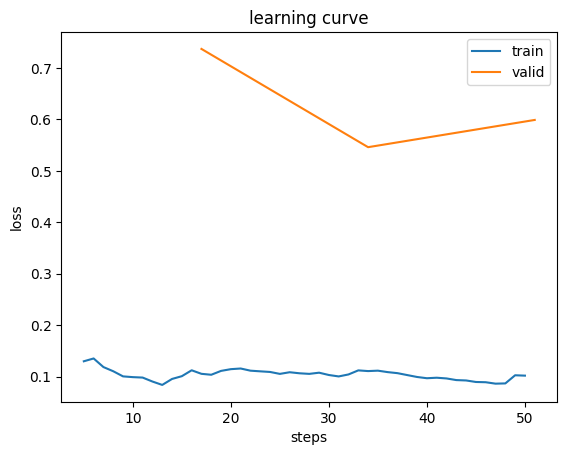

In [ ]:
# Check if the learner object has been overwritten with a Sequential object
if not isinstance(learner, Learner):
    raise ValueError("The learner object has been overwritten with a Sequential object. Please remove the overwriting code.")

# Fine-tune the learner
learner.fine_tune(3)

# Plot the loss and metrics
learner.recorder.plot_loss()
learner.recorder.plot_metrics()



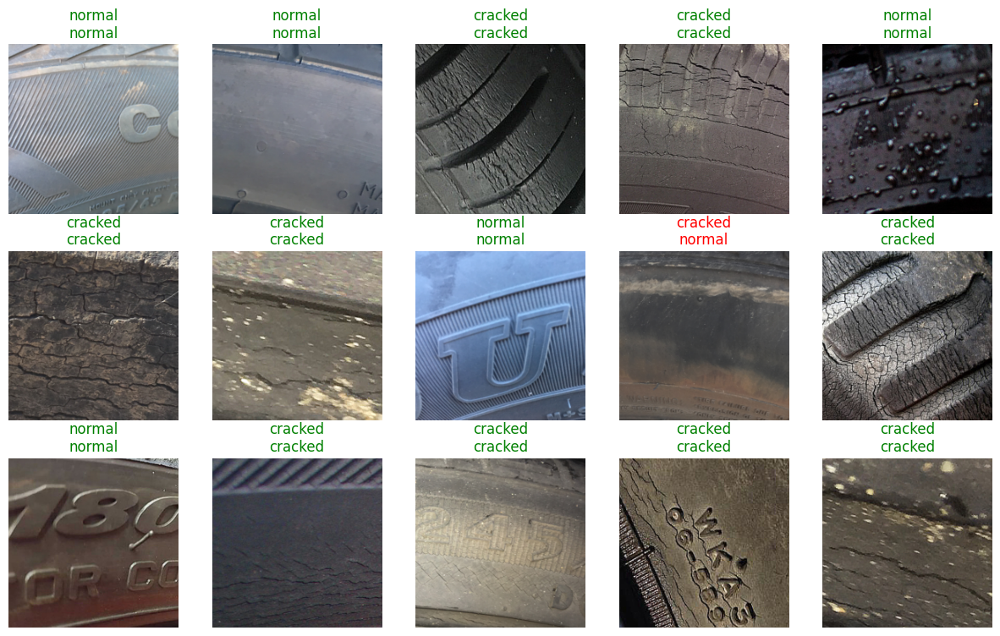

In [ ]:
learner.show_results(max_n=15)


SuggestedLRs(valley=6.30957365501672e-05)

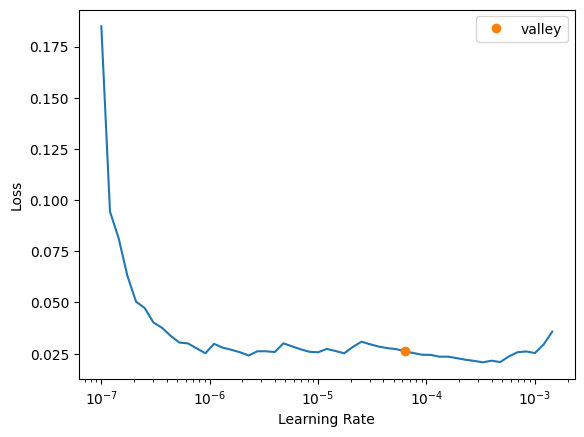

In [ ]:
learner.lr_find()


In [ ]:
print(learner)

In [ ]:
learn=load_learner('/content/drive/MyDrive/Tire Textures/models')

RuntimeError: PytorchStreamReader failed locating file data.pkl: file not found

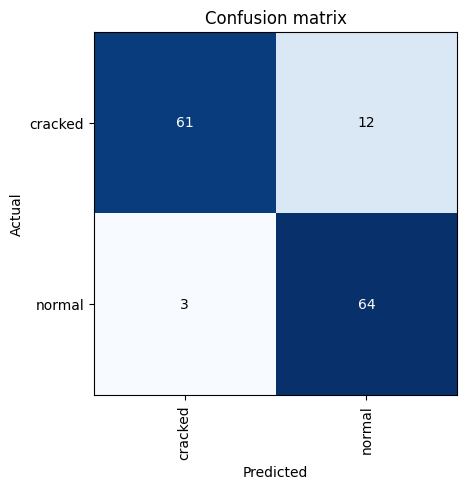

In [ ]:
interp=ClassificationInterpretation.from_learner(learner)
interp.plot_confusion_matrix()

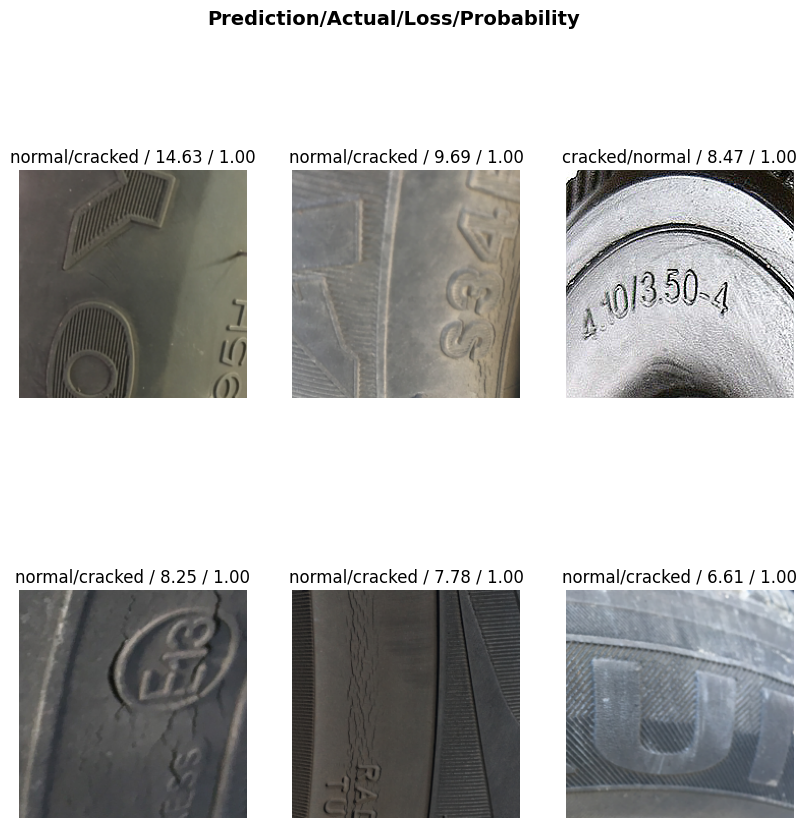

In [ ]:
interp.plot_top_losses(6,figsize=(10,10))

In [ ]:
interp.print_classification_report()

              precision    recall  f1-score   support

     cracked       0.95      0.84      0.89        73
      normal       0.84      0.96      0.90        67

    accuracy                           0.89       140
   macro avg       0.90      0.90      0.89       140
weighted avg       0.90      0.89      0.89       140



In [ ]:
interp.most_confused()

[('cracked', 'normal', 12), ('normal', 'cracked', 3)]

In [ ]:
learner.save('/content/drive/MyDrive/Tire Textures')

Path('/content/drive/MyDrive/Tire Textures.pth')

In [ ]:
print(learner)


NameError: name 'learner' is not defined

In [ ]:
data = {
    'epoch': list(range(20)),
    'train_loss': [0.239496, 0.194688, 0.156436, 0.142155, 0.137269, 0.131148, 0.109835, 0.099376, 0.098090, 0.100482,
                   0.095386, 0.089624, 0.076935, 0.075484, 0.064168, 0.053535, 0.053154, 0.045230, 0.039444, 0.032893],
    'valid_loss': [0.522606, 0.609158, 0.593918, 0.488203, 0.676418, 0.548820, 0.469309, 0.523436, 0.612900, 0.596528,
                   0.637717, 0.527607, 0.500692, 0.502825, 0.527544, 0.539243, 0.541809, 0.565711, 0.554011, 0.548720],
    'accuracy': [0.885714, 0.857143, 0.885714, 0.892857, 0.878571, 0.878571, 0.892857, 0.900000, 0.885714, 0.892857,
                 0.885714, 0.892857, 0.900000, 0.900000, 0.900000, 0.892857, 0.892857, 0.892857, 0.892857, 0.892857],
    'error_rate': [0.114286, 0.142857, 0.114286, 0.107143, 0.121429, 0.121429, 0.107143, 0.100000, 0.114286, 0.107143,
                   0.114286, 0.107143, 0.100000, 0.100000, 0.100000, 0.107143, 0.107143, 0.107143, 0.107143, 0.107143]}

df = pd.DataFrame(data)

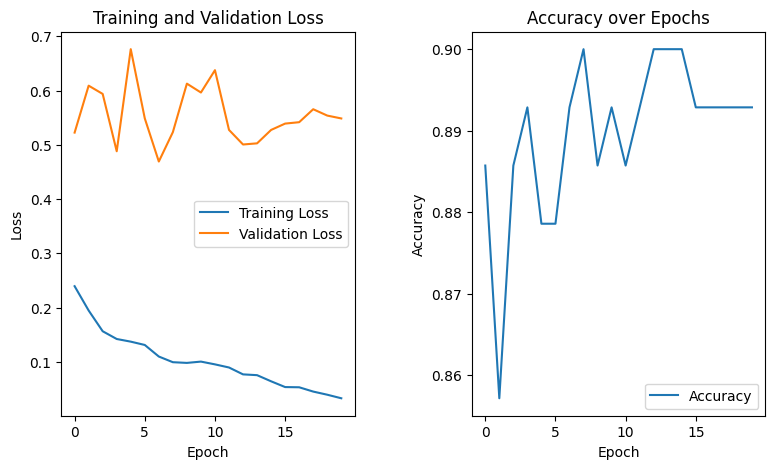

In [ ]:
import matplotlib.pyplot as plt
plt.subplots_adjust(left=0.1,
                    bottom=0.1,
                    right=1.2,
                    top=0.9,
                    wspace=0.4,
                    hspace=0.4)
# Plotting training loss
plt.subplot(1,2,1)
plt.plot(df['epoch'], df['train_loss'], label='Training Loss')
plt.plot(df['epoch'], df['valid_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
# Plotting accuracy
plt.subplot(1,2,2)
plt.plot(df['epoch'], df['accuracy'], label='Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy over Epochs')
plt.legend()
plt.show()

In [ ]:
resBasic = []
tst_files = get_image_files(test_dir)

for file in tst_files:
    a = file
    a = str(a).split('/')
    resBasic.append([a[-1], a[-2], learner.predict(file, with_input=True)[1]])
    'ok'

In [ ]:
resBasic_df=pd.DataFrame(resBasic,columns=['File','Class','Prediction'])
resBasic_df[resBasic_df['Class'] != resBasic_df['Prediction']]

,File,Class,Prediction
0,Cracked-262.jpg,cracked,cracked
1,Cracked-20.jpg,cracked,cracked
2,Cracked-26.jpg,cracked,cracked
3,Cracked-43.jpg,cracked,cracked
4,Cracked-37.jpg,cracked,cracked


In [ ]:
rigth = 0
wrong = 1
for x in resBasic:
    if(x[1] == x[2]):
        rigth=rigth+1
    else:
        wrong=wrong+1

precision = rigth/(rigth+wrong)
print('Rigth:', rigth)
print('Wrong:', wrong)
print('Precision:', precision)

Rigth: 266
Wrong: 60
Precision: 0.8159509202453987


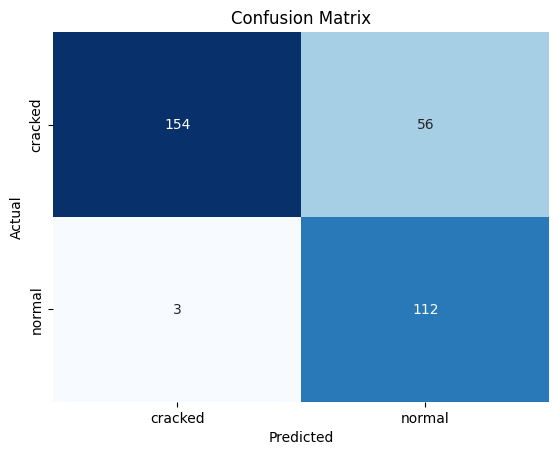

In [ ]:
from sklearn.metrics import confusion_matrix
cfn_mtrx=confusion_matrix(resBasic_df['Class'],resBasic_df['Prediction'])
sns.heatmap(cfn_mtrx,annot=True,cmap='Blues',fmt='d',cbar=False,xticklabels=['cracked','normal'],yticklabels=['cracked','normal'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()